In [1]:
import os
import sys
import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib.colors import rgb_to_hsv
from segment_anything import SamPredictor, sam_model_registry
from sklearn.cluster import KMeans
from ultralytics import YOLO
import csv

# Определение цвета автомобиля на фотографии

В этом ноутбуке мы решим задачу определения цвета автомобиля на фотографии для создания демо-стенда.

**Описание задачи**: На входе — фотография с одним или несколькими автомобилями. Нужно определить цвет (или несколько цветов) каждого автомобиля. Мы фокусируемся на одном автомобиле, возвращая основной цвет в bounding box на русском и список всех цветов с RGB-кодами.

**Как будем решать**:
1. Детекция автомобилей с помощью YOLO (предобученная модель).
2. Получение bounding box (bbox) и сегментация автомобиля с помощью Segment Anything (SAM).
3. Кластеризация пикселей автомобиля для выделения 3 основных цветов (K-Means).
4. Классификация цветов в HSV-пространстве с названиями на русском.
5. Создание функции обработки изображения и обёртывание в API (FastAPI).
6. Разработка демо-стенда на Gradio.

**Цель ноутбука**: Пошагово отработать логику обработки изображения, затем написать функцию для API и демо. 

**План ноутбука**:
1. Загрузка изображения и предобработка + визуализация.
2. Детекция автомобилей с YOLO.
3. Сегментация автомобиля с SAM.
4. Кластеризация цветов.
5. Определение и визуализация цветов.

# Загрузка и базовая фильтрация изображения

In [2]:
os.chdir('..')

In [3]:
# для начала перейдем в папку с фотографиями

if os.getcwd().split('/')[-1] != 'data': os.chdir('data/photos/')
images = os.listdir(os.getcwd()) #проверим фотки

images

['images.jpeg',
 'images4.jpeg',
 'photo_2025-05-14 17.29.21.jpeg',
 'images3.jpeg',
 'images12.jpeg',
 'images2.jpeg',
 'photo_2025-05-14 17.29.16.jpeg',
 'istockphoto-1742406965-612x612.jpg',
 'unnamed.png',
 'photo_2025-05-14 17.29.18.jpeg',
 'smart_crop_516x290.jpeg',
 'r5zzvr4pdfkwg0oksgk.jpg',
 'istockphoto-494522913-612x612.jpg',
 'RIAN_3245007.HR.ru.jpg']

In [4]:
# загрузка изображения

image_path = images[9]

image = cv2.imread(image_path)

if image is None:
    raise ValueError('Нет изображения')

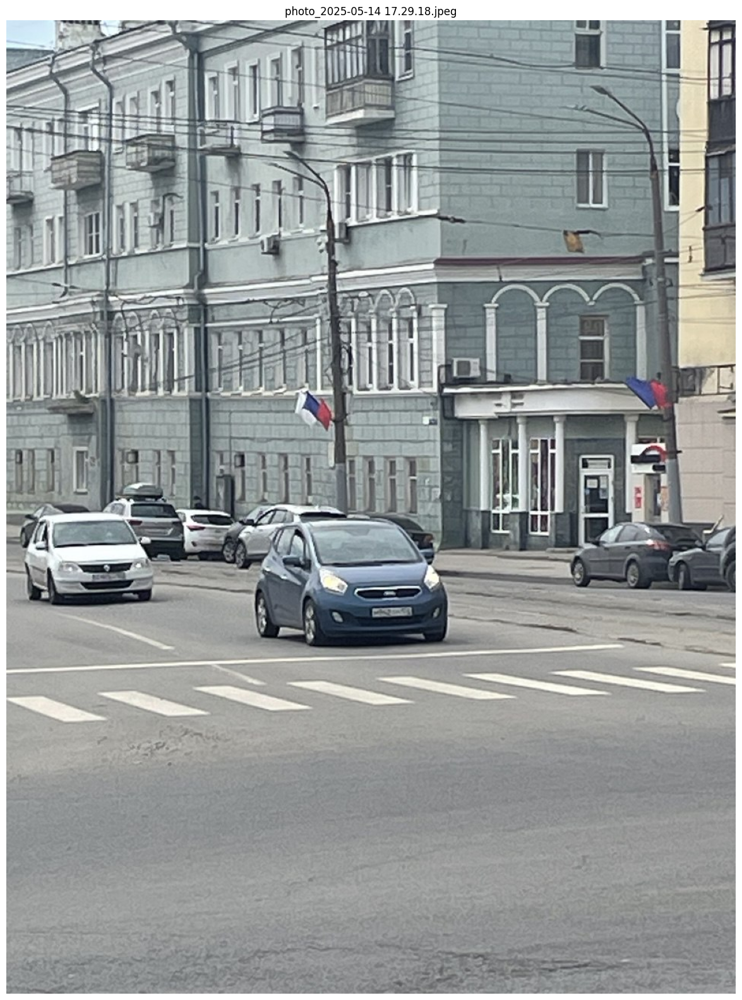

In [5]:
# посмотрим на изображение

plt.figure(figsize=(15,20))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title(f'{image_path}')
plt.axis(False)
plt.show()

In [6]:
# Ресайз до 512x512
# опционально - снижает нагрузку на память

max_size = 512
h, w = image.shape[:2]
scale = max_size / max(h, w)
if scale < 1:
    image = cv2.resize(image, (int(w * scale), int(h * scale)))

Базовая обработка в нашем случае будет включать нормализацию и легкое размытие.
Это делается для того, чтобы предобученным моделям было проще справляться со своей задачей.

In [7]:
# Размытие
#image = cv2.GaussianBlur(image, (3, 3), 0)

# Нормализация
image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)

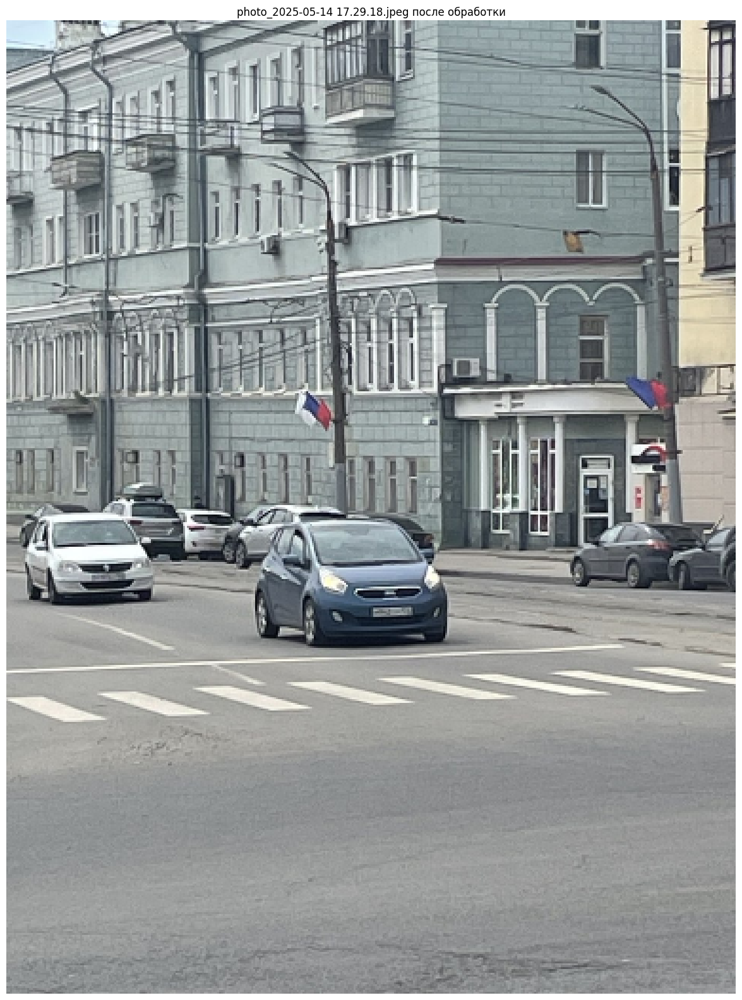

In [8]:
# посмотрим на изображение

plt.figure(figsize=(15,20))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title(f'{image_path} после обработки')
plt.axis(False)
plt.show()

# Детекция автомобиля на фото с помощью YOLO

In [9]:
for i in range(2): os.chdir('..') #перейдем обратно к корню

In [10]:
# Загружаем модель YOLOv8
model = YOLO('models/yolov8n.pt')

In [11]:
#посмотрим, как работает YOLO

result = model(image)[0]


0: 640x480 9 cars, 46.9ms
Speed: 1.7ms preprocess, 46.9ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 480)


Далее будем записывать в словарь `cars` все обнаруженные машины. Для конкрентной машины сначала добавим примерные границы.

In [12]:
cars = {}
i = 0

for box in result.boxes:

    if model.names[int(box.cls)] == 'car' or model.names[int(box.cls)] == 'truck':
        bbox = box.xyxy[0].cpu().numpy().astype(int)  # --> [x_min, y_min, x_max, y_max]

        cars[f'car_{i}'] = {'bbox': None}
        cars[f'car_{i}']['bbox'] = bbox

    i += 1

In [13]:
cars

{'car_0': {'bbox': array([129, 261, 232, 329])},
 'car_1': {'bbox': array([  8, 257,  77, 307])},
 'car_2': {'bbox': array([296, 263, 365, 299])},
 'car_3': {'bbox': array([113, 254, 180, 288])},
 'car_4': {'bbox': array([348, 264, 383, 300])},
 'car_5': {'bbox': array([ 51, 251,  94, 284])},
 'car_6': {'bbox': array([ 92, 257, 120, 284])},
 'car_7': {'bbox': array([113, 254, 158, 288])},
 'car_8': {'bbox': array([183, 259, 227, 282])}}

Теперь мы храним bboxes, далее на этих bbox нужно четче определять машину.

# Выделение машины в рамках bbox с SAM

In [14]:
# зададим путь, модель, и что у нас нет gpu

sam_checkpoint = "models/sam_vit_b_01ec64.pth"  
model_type = "vit_b"
device = "cpu"

In [15]:
try:
    sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
    sam.to(device)
except FileNotFoundError:
    raise FileNotFoundError("Чекпоинт SAM не найден")

predictor = SamPredictor(sam)

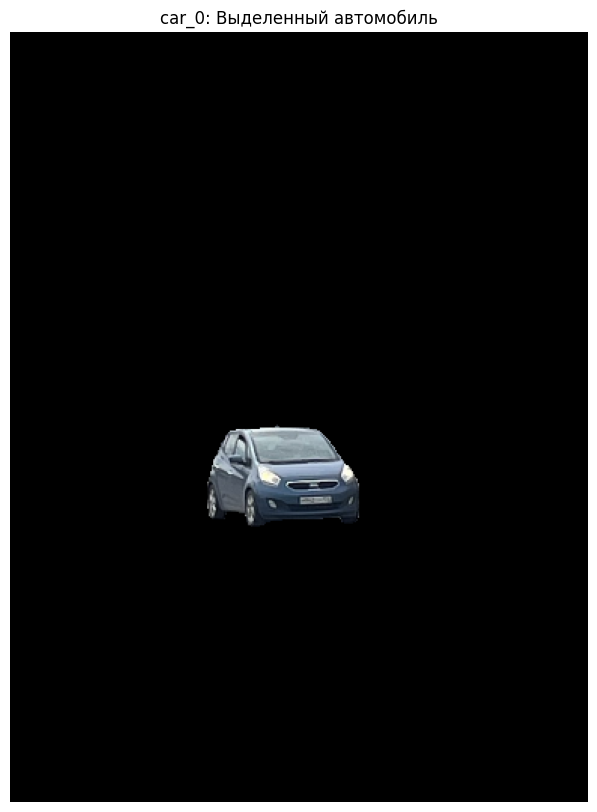

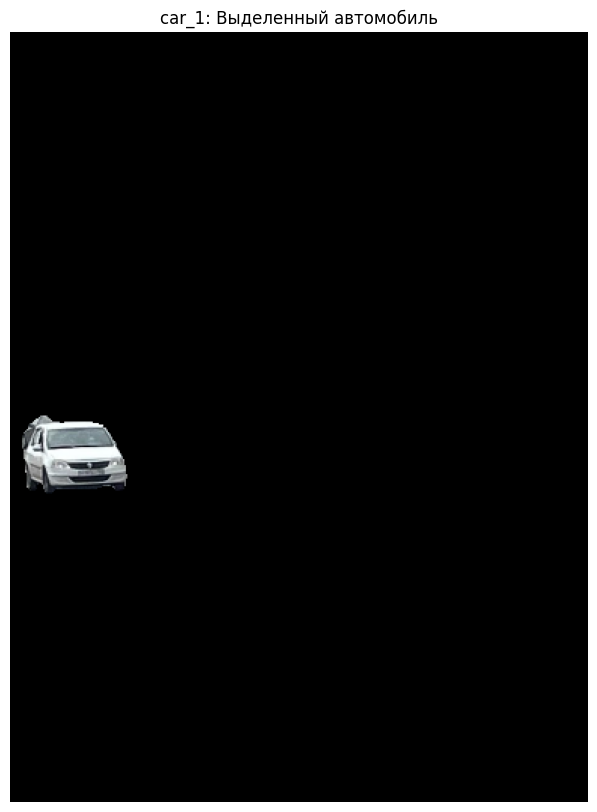

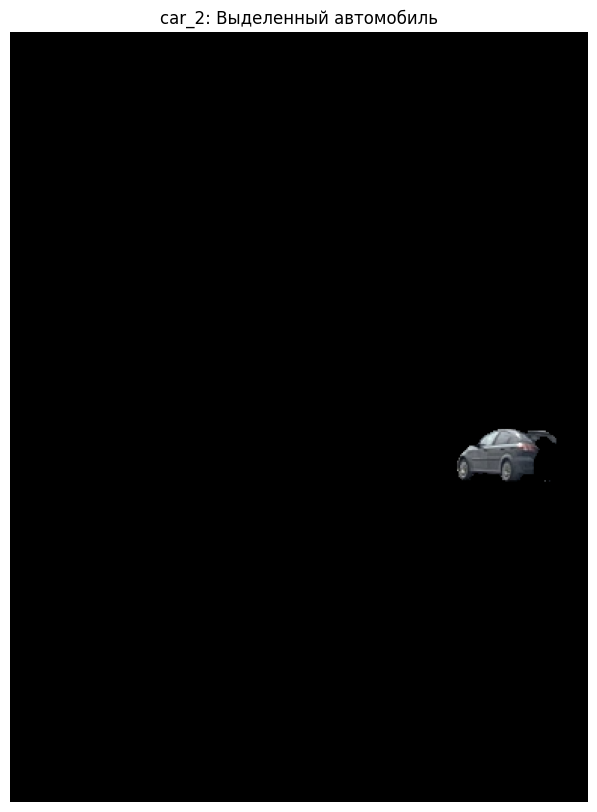

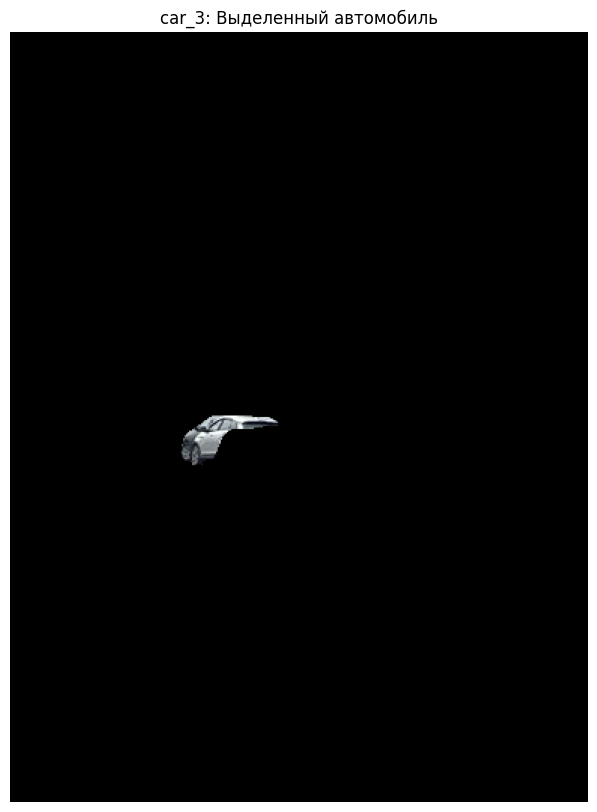

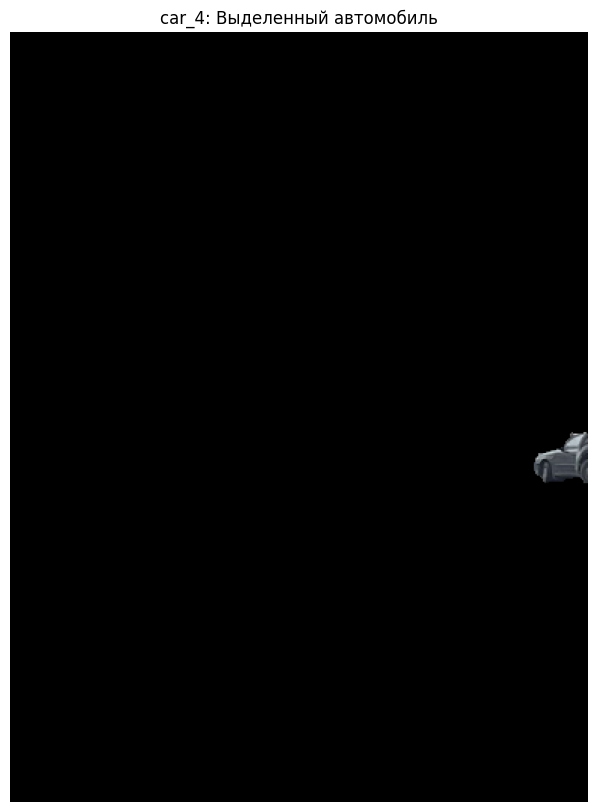

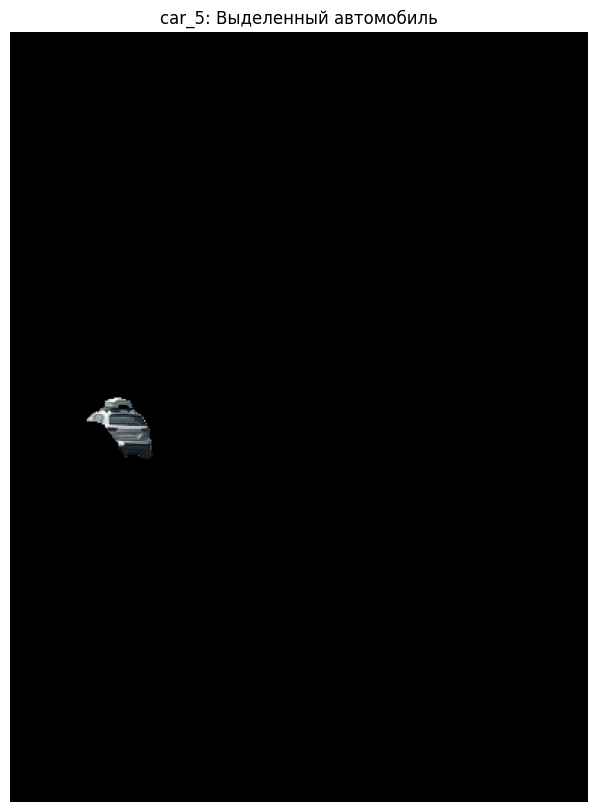

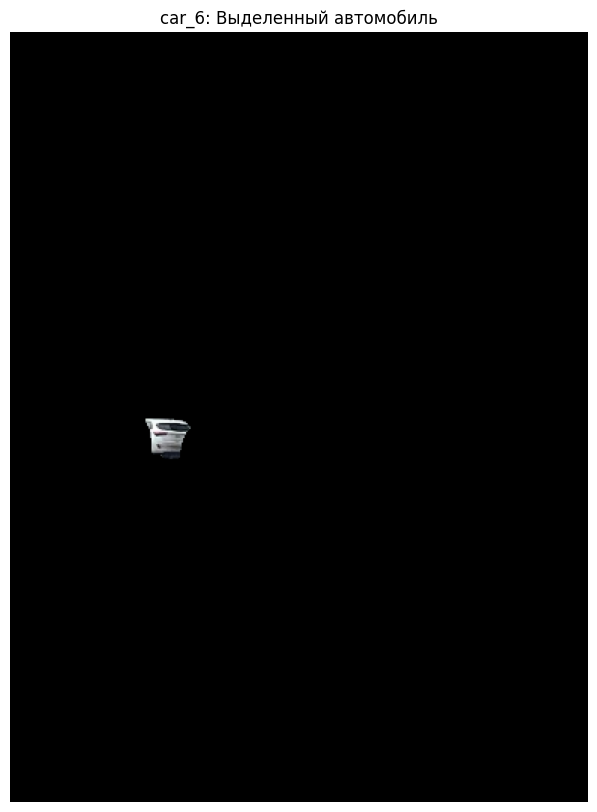

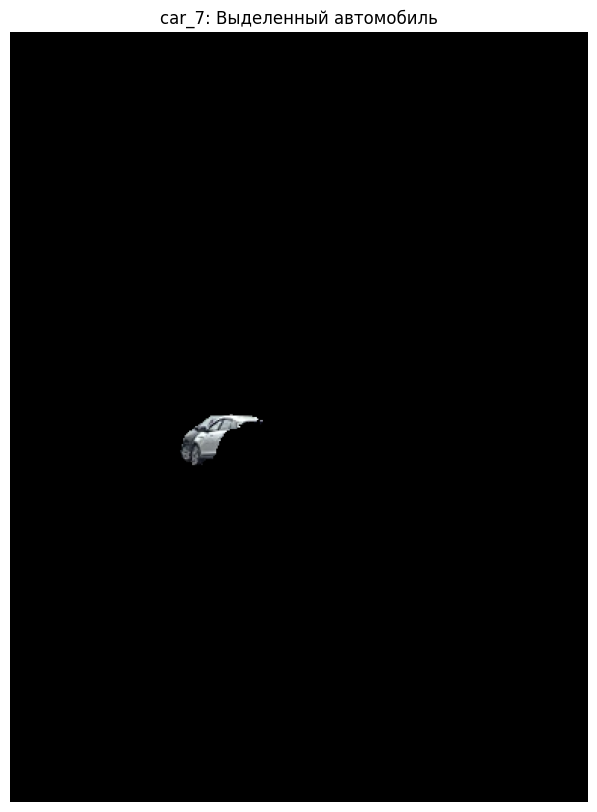

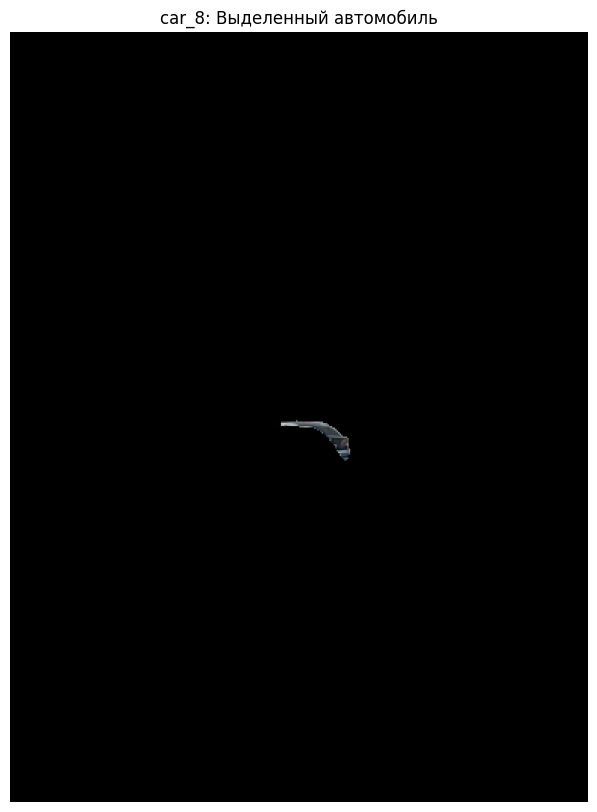

In [16]:
# Сегментация для каждого автомобиля
for car_id, car_data in cars.items():
    bbox = car_data['bbox']
    
    # Расширяем bbox на 10%
    margin = 0.1
    x_min, y_min, x_max, y_max = bbox
    w, h = x_max - x_min, y_max - y_min
    x_min = max(0, x_min - int(w * margin))
    y_min = max(0, y_min - int(h * margin))
    x_max = min(image.shape[1], x_max + int(w * margin))
    y_max = min(image.shape[0], y_max + int(h * margin))
    bbox_expanded = np.array([x_min, y_min, x_max, y_max])
    
    # Сегментация
    predictor.set_image(image)
    masks, scores, _ = predictor.predict(
        box=bbox_expanded,
        multimask_output=False
    )
    
    # Проверка маски
    if len(masks) == 0 or np.max(scores) < 0.5:
        #print(f"{car_id}: Маска не найдена, использую bbox")
        mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
        mask[bbox[1]:bbox[3], bbox[0]:bbox[2]] = 1
    else:
        mask = masks[np.argmax(scores)]
    
    # Сохраняем маску
    cars[car_id]['mask'] = mask
    
    # Визуализация
    car_masked = cv2.bitwise_and(image, image, mask=mask.astype(np.uint8))
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(car_masked, cv2.COLOR_BGR2RGB))
    plt.title(f"{car_id}: Выделенный автомобиль")
    plt.axis('off')
    plt.show()

# Освобождаем память
del predictor
del sam
torch.cuda.empty_cache() if torch.cuda.is_available() else None

--> Ура, теперь у нас есть маска для выделения автомобиля. Теперь можно переходить к следующему шагу.

# Кластеризация

На этом этапе важно следить за преобразованиями цвета.
Тут:
```python
hsv_pixels = rgb_to_hsv(pixels/ 255.0)
```
преобразовываем пиксели, каждый из которых - кортеж BGR (так в cv2)
поэтому заранее 
```python
# Извлечение пикселей
    pixels = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)[mask > 0].reshape(-1, 3)
```

а дальше используем invert_mask = [2, 1, 0] --> чтобы корректно отображать полоски цвета

Несколько подходов к определению цвета:

1) Использовать среднее по каждому каналу пикселя - но тут совсем уж всё смазано получается
2) Сначала кластеризовать (выделить скопления в 3-мерном пространстве RGB) --> найти максимально близкие к друг другу пиксели и использовать центры кластеров как предположительные цвета
    - можно использовать медиану по кластеру
    - можно использовать самый популярный цвет 

У каждого подхода есть свои ограничения, но при нормальном изображении каждый подход отрабатывает примерно одинаково.

In [17]:
invert_mask = [2, 1, 0]

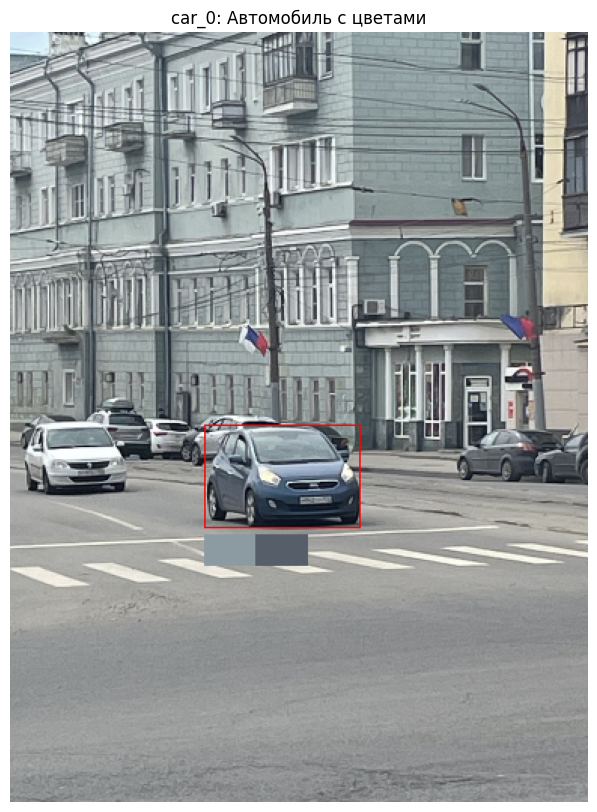

car_0 цвета (RGB): [[140, 155, 162], [86, 94, 105]]


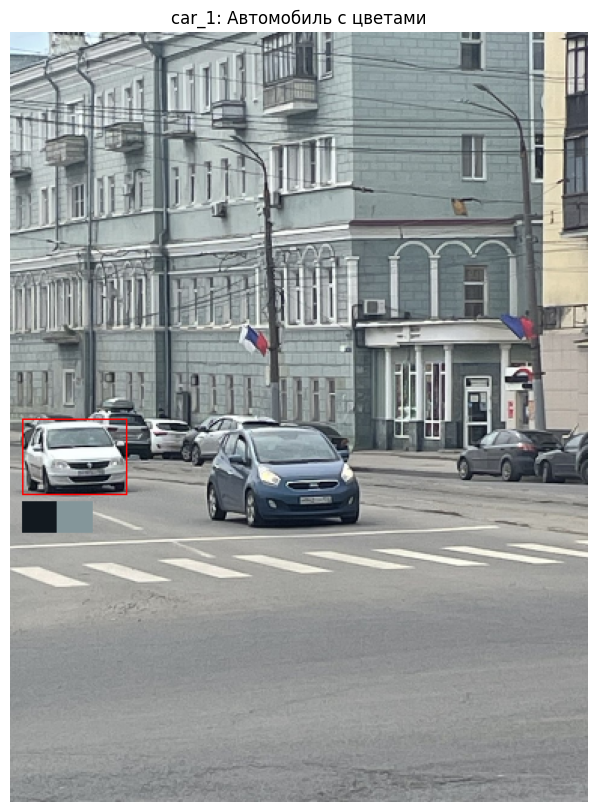

car_1 цвета (RGB): [[18, 25, 31], [132, 150, 154]]


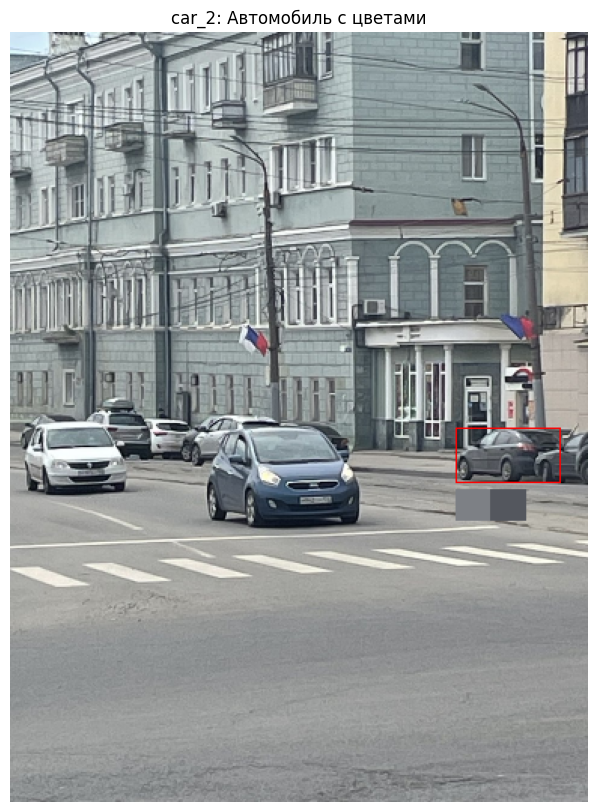

car_2 цвета (RGB): [[125, 128, 133], [84, 87, 94]]


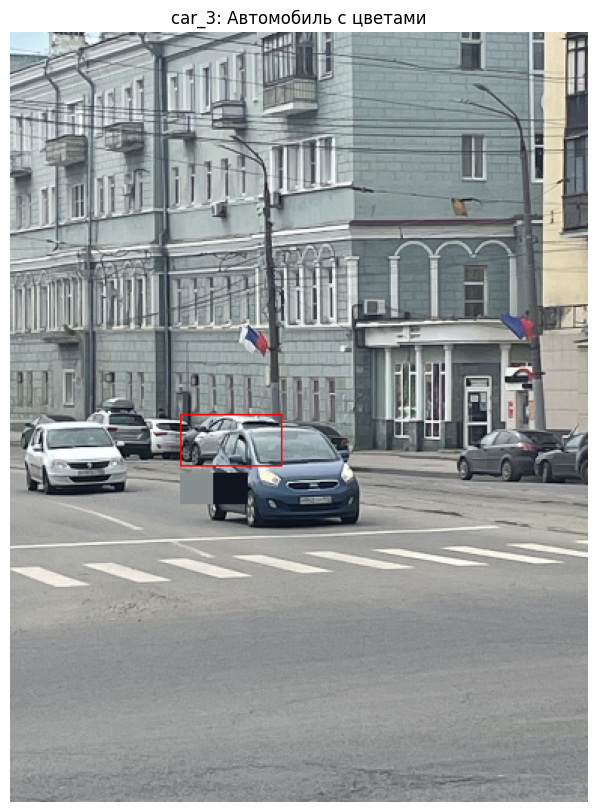

car_3 цвета (RGB): [[137, 142, 145], [16, 20, 31]]


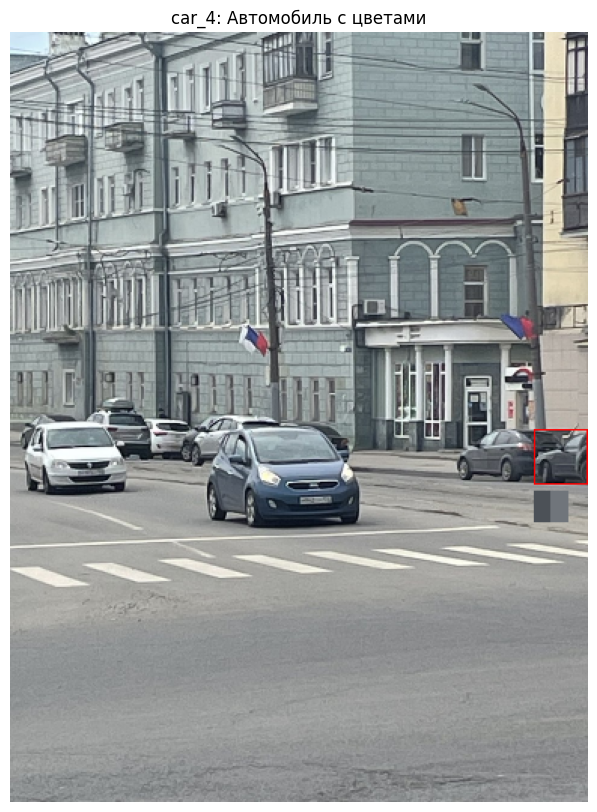

car_4 цвета (RGB): [[76, 81, 87], [112, 117, 123]]


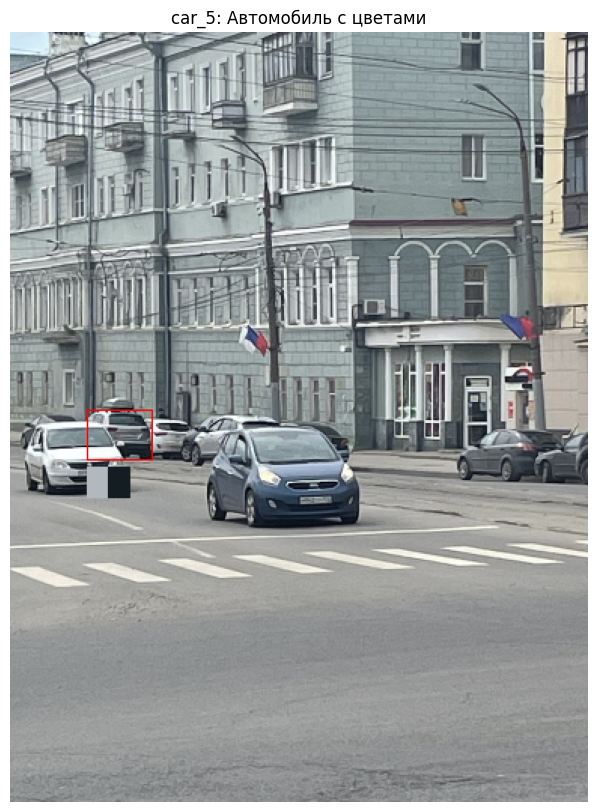

car_5 цвета (RGB): [[177, 185, 188], [20, 29, 34]]


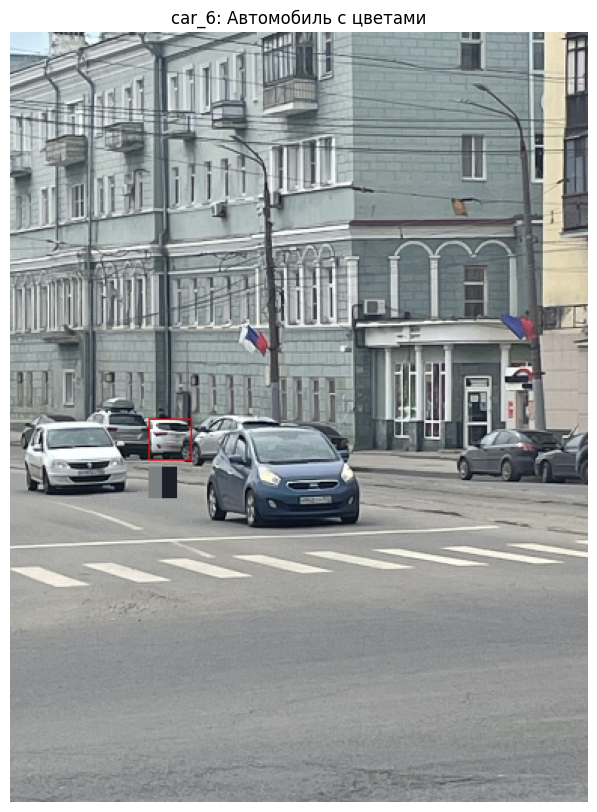

car_6 цвета (RGB): [[123, 129, 129], [28, 31, 40]]


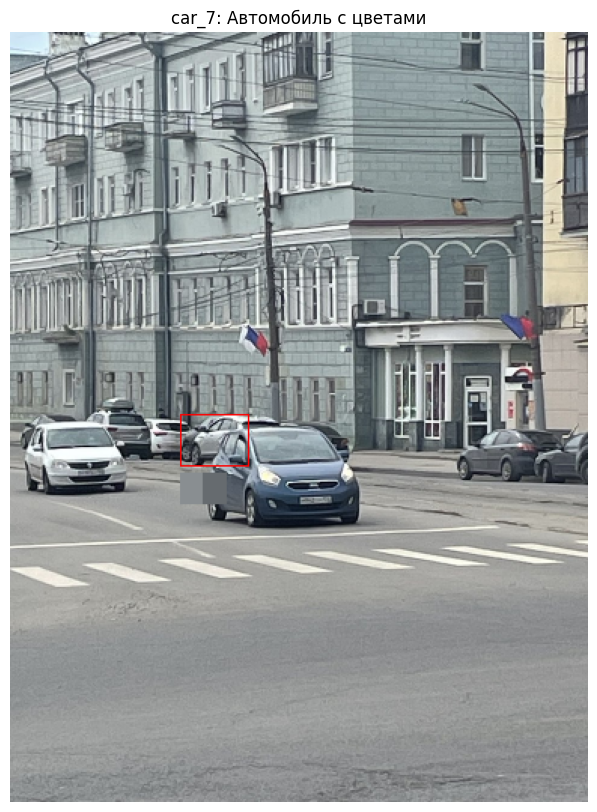

car_7 цвета (RGB): [[137, 142, 145], [102, 107, 111]]


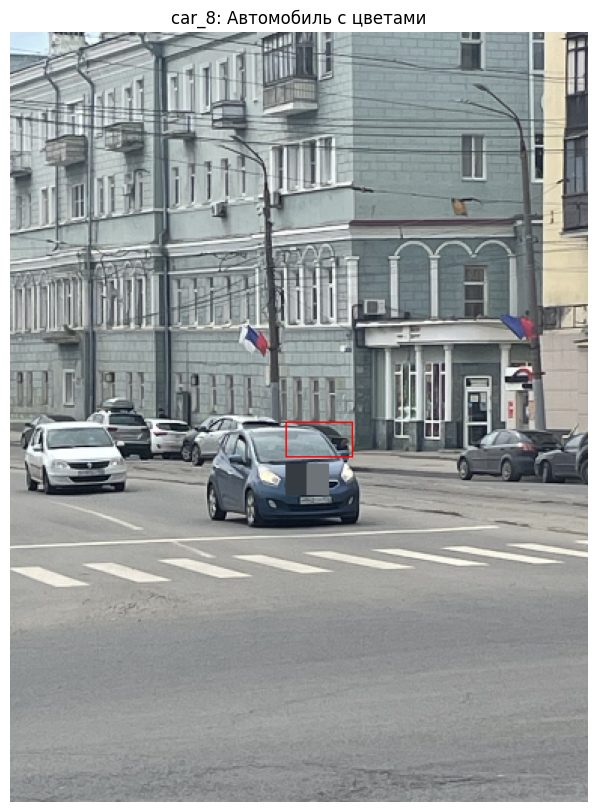

car_8 цвета (RGB): [[54, 59, 65], [110, 115, 119]]


In [18]:
# Кластеризация для каждого автомобиля
for car_id, car_data in cars.items():
    mask = car_data['mask']
    bbox = car_data['bbox']
    
    # Извлечение пикселей
    pixels = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)[mask > 0].reshape(-1, 3)
    if len(pixels) == 0:
        print(f"{car_id}: Пиксели не найдены, использую bbox")
        pixels = image[bbox[1]:bbox[3], bbox[0]:bbox[2]].reshape(-1, 3)
    
    # Фильтрация в HSV
    hsv_pixels = rgb_to_hsv(pixels/ 255.0)
    mask_valid = (hsv_pixels[:, 2] > 0.1) & (hsv_pixels[:, 2] < 0.95)
    filtered_pixels = pixels[mask_valid]
    
    if len(filtered_pixels) < 10:
        print(f"{car_id}: Недостаточно валидных пикселей")
        cars[car_id]['colors_rgb'] = []
        continue
    
    # Кластеризация
    kmeans = KMeans(n_clusters=2, random_state=42)
    kmeans.fit(filtered_pixels)
    labels = kmeans.labels_  # метка кластера для каждого объекта
    # Считаем количество объектов в каждом кластере
    unique_labels, counts = np.unique(labels, return_counts=True)
    # # сохраняем в порядке убывания количества пикселей, принадлежащих к этому кластеру
    # cars[car_id]['colors_rgb'] = kmeans.cluster_centers_.astype(int)[np.argsort(counts)[::-1]]

    # Вычисление самого популярного цвета для каждого кластера
    colors_rgb = []
    for label in unique_labels:
        cluster_pixels = filtered_pixels[labels == label]
        color, counts = np.unique(cluster_pixels, return_counts=True, axis=0)
        colors_rgb.append(color[np.argmax(counts)])
        # median_color = np.median(cluster_pixels, axis=0).astype(int)
        # colors_rgb.append(median_color)
    colors_rgb = np.array(colors_rgb)
    
    # Сортировка по количеству пикселей
    # sort_indices = np.argsort(counts)[::-1]
    # cars[car_id]['colors_rgb'] = colors_rgb[sort_indices]
    cars[car_id]['colors_rgb'] = colors_rgb
    
    # Визуализация: цвета рядом с машиной
    output_image = image.copy()
    
    # Рисуем bbox
    cv2.rectangle(output_image, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (0, 0, 255), 1)
    
    # Полоски цветов под bbox
    patch_height = 20
    patch_width = (bbox[2] - bbox[0]) // 3  # Делим ширину bbox на 3
    for i, color in enumerate(cars[car_id]['colors_rgb']):
        x_start = bbox[0] + i * patch_width
        x_end = x_start + patch_width
        y_start = bbox[3] + 5  # 5 пикселей ниже bbox
        y_end = y_start + patch_height
        cv2.rectangle(output_image, (x_start, y_start), (x_end, y_end), tuple(color[invert_mask].tolist()), -1)
    
    # Визуализация
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
    plt.title(f"{car_id}: Автомобиль с цветами")
    plt.axis('off')
    plt.show()
    print(f"{car_id} цвета (RGB): {cars[car_id]['colors_rgb'].tolist()}")

# Определение и визуализация цветов

Возьмем таблицу с сайта https://colorscheme.ru/car-color-paint.html --> скопируем html код таблицы с промптом
```
создай словарь в таком формате
Пример:
<tr>
    <td class="c">102</td>
    <td class="l" bgcolor="#cc6633"></td>
    <td>Абрикос</td>
    <td>Серебристо-светло оранжевый</td>
    <td class="m">+</td>
</tr>
Словарь:
COLOR_DATABASE = [
    ("Абрикос", "Серебристо-светло оранжевый", цвет hex),
]
```
Получим цвета.

In [19]:
COLOR_DATABASE = [
    ("Абрикос", "Серебристо-светло оранжевый", "#cc6633"),
    ("Авантюрин", "Серебристо-чёрный", "#00111b"),
    ("Айсберг", "Белая двухслойная", "#edf5f6"),
    ("Акапулько", "Ярко-жёлтый", "#ffff33"),
    ("Аквамарин", "Серебристый сине-зелёный", "#0a7679"),
    ("Аккорд", "Серебристо-коричневый", "#665739"),
    ("Аллигатор", "Оливково-зелёный", "#336600"),
    ("Алмазное серебро", "(ИЖ) Серебристый", "#eeeeee"),
    ("Альпийский снег", "Белый металлик", "#ffffff"),
    ("Альтаир", "Серебристый светло-серый", "#858585"),
    ("Амазонка", "Ярко-зелёный", "#008060"),
    ("Аметист", "Серебристый фиолетовый", "#32011f"),
    ("Амулет", "Серебристо-тёмно-зелёный", "#002200"),
    ("Андриатика", "Голубой", "#3a5e74"),
    ("Антарес", "Тёмно-вишнёвый", "#2f0000"),
    ("Антилопа", "Серебристо-бежевый", "#efcd94"),
    ("Апатия", "Серебристый оранжевый", "#d3671f"),
    ("Аспарагус", "Серебристо-зелёный", "#ece8b7"),
    ("Астероид", "Тёмно-сине-зелёный", "#000000"),
    ("Атлантика", "Светло-синий", "#486c95"),
    ("Аустер", "(GM) Светло-серый", "#cccccc"),
    ("Афалина", "Серебристо-зелёно-голубой", "#72b8b8"),
    ("Аэлита", "Бежевый", "#EEE4AC"),
    ("Базальт", "Серо-чёрный", "#000000"),
    ("Баклажан", "Тёмно-фиолетовый", "#300e1d"),
    ("Балтика", "Тёмно-сине-зелёный", "#093e5e"),
    ("Бальзам", "Зелёный", "#078d51"),
    ("Бархан", "Бежевый", "#dcddcd"),
    ("Бежевый", "Бежевый", "#eaebde"),
    ("Белое облако", "Белый", "#F8F9FA"),
    ("Белый", "Белый", "#f8eff0"),
    ("Бергамот", "Серебристо-зелёный", "#00974b"),
    ("Борнео", "Серебристо-тёмно серый", "#3F434D"),
    ("Боровница", "Серебристо-серо-синий", "#516371"),
    ("Бриз", "Зелёно-голубой", "#84bdb4"),
    ("Бронзовый век", "Бежево-коричневый", "#796745"),
    ("Бургундия", "Красный металлик", "#561919"),
    ("Вавилон", "Металлик серо-бежевый", "#fbf1d0"),
    ("Валентина", "Серо-фиолетовый", "#12294b"),
    ("Валюта", "Серо-зелёный", "#707561"),
    ("Венера", "Тёмно-красный", "#5a0107"),
    ("Викинг", "Тёмно-серый", "#373737"),
    ("Виктория", "Серебристый ярко-красный", "#ae0000"),
    ("Вишнёвый сад", "Тёмно-серебристо-красный", "#640032"),
    ("Вишня", "Тёмно-бордовый", "#800040"),
    ("Водолей", "Серо-зелёный", "#448486"),
    ("Галактика", "Тёмно-фиолетовый", "#27004f"),
    ("Гейзер", "Серо-голубой", "#bac7c2"),
    ("Голубой", "Голубой", "#b3faff"),
    ("Гранат", "Тёмно-бордовый", "#800000"),
    ("Гранта", "Серо-синий", "#031E36"),
    ("Дефиле", "Серебристо-серо-коричневый", "#773c3c"),
    ("Джем", "Оранжево-коричневый", "#c86829"),
    ("Дипломат", "Синий", "#003B62"),
    ("Дыня", "Серебристо-жёлтый", "#f9f8bb"),
    ("Дюшес", "Серебристо-молочно-зелёный", "#66cccc"),
    ("Жасмин", "Бело-жёлтый", "#f3f3cf"),
    ("Жёлтый-такси", "Ярко-жёлтый", "#ffc100"),
    ("Жемчуг", "Серебристо-бело-молочный", "#c0c0c0"),
    ("Жимолость", "Серо-синий", "#4b4d64"),
    ("Защитный", "Зелёный", "#669966"),
    ("Звёздная Пыль", "Бежево-сиреневый", "#d3cdb6"),
    ("Зелёный сад", "Тёмно-зелёный", "#003c00"),
    ("Зелёный", "Зелёный", "#009933"),
    ("Зелёный Авокадо", "(ИЖ) Тёмно-зелёный", "#003c00"),
    ("Золотая звезда", "(GM) Бежево-золотистый", "#e9d28a"),
    ("Золотой лист", "Золотистый тёмно-зелёный", "#353313"),
    ("Золотая Нива", "Серебристо-жёлто-зелёный", "#a6a600"),
    ("Золотисто-бежевый", "(ИЖ) Золотисто-бежевый", "#d3cdb9"),
    ("Золото Инков", "Золотистый тёмно-зелёный", "#2c3c26"),
    ("Игуана", "Серебристо-ярко-зелёный", "#1e9324"),
    ("Изабелла", "Тёмно-филетовый", "#522d64"),
    ("Изумруд", "Серебристо-зелёный", "#366d6d"),
    ("Индиго", "Тёмно-синий", "#000642"),
    ("Ирис", "Фиолетовый", "#200f33"),
    ("Искра", "Красный", "#4a0001"),
    ("Каберне", "Тёмно-вишнёвый", "#510724"),
    ("Кайман", "Тёмно-зелёный", "#006600"),
    ("Калина", "Ярко-красный", "#c50707"),
    ("Калифорнийский Мак", "Золотисто-красный", "#970100"),
    ("Капри", "Тёмно-сине-зелёный", "#003955"),
    ("Капучино", "Светлый серо-бежевый", "#d0aa9b"),
    ("Кардинал", "Ярко-красный", "#b90000"),
    ("Кармен", "Красный", "#b90000"),
    ("Кварц", "Тёмно-серый", "#808080"),
    ("Кедр", "Серо-зелёный", "#384f2f"),
    ("Кентавр", "Тёмно-зелёный", "#2c3c26"),
    ("Колумбийская зелень", "Золотисто-оливковый", "#6D7148"),
    ("Коралл", "Серебристый тёмно-красный", "#7e013d"),
    ("Кориандр", "Золотисто-коричневый", "#8A6749"),
    ("Корица", "Коричневый", "#200204"),
    ("Корсика", "Серебристый болотно-зелёный", "#373b2c"),
    ("Космос", "Чёрный", "#101419"),
    ("Красный перец", "(ИЖ) Серебристо-вишнёвый", "#880f24"),
    ("Красный Порту", "(ИЖ) Вишнёвый", "#640032"),
    ("Кристалл", "Светло-серый", "#bebebe"),
    ("Кубок", "Красный", "#bf311a"),
    ("Ла-манш", "Серебристо-фиолетовый", "#331159"),
    ("Лаванда", "Серебристо-коричневый", "#886542"),
    ("Лагуна", "Серебристо-синий", "#002e3b"),
    ("Ладога", "Серебристо-голубой", "#e1ecfd"),
    ("Лазурит", "Фиолетово-синий", "#0b083f"),
    ("Лазурно-синий", "Серебристый тёмно-синий", "#001522"),
    ("Лазурь", "Синий", "#0067ce"),
    ("Ламинария", "Зелёный", "#00a653"),
    ("Ледниковый", "Белый", "#DFE7E8"),
    ("Ледяной", "Голубой", "#e5eaff"),
    ("Лунный Свет", "Светло-голубой", "#bdd0e4"),
    ("Магеллан", "Тёмно-синий", "#103661"),
    ("Магия", "Серебристо-ярко-фиолетовый", "#580062"),
    ("Магма", "Оранжевый", "#D35F11"),
    ("Майя", "Серебристый тёмно-бордовый", "#2e0203"),
    ("Мальборо", "Красный металлик", "#ff0000"),
    ("Медео", "Голубой", "#0d3e8b"),
    ("Медовый", "Желто-золотой", "#f4bf06"),
    ("Меридиан", "Зелёный", "#006c6c"),
    ("Мерцающий синий", "(ИЖ) Серебристо-тёмно-синий", "#004f95"),
    ("Миндаль", "Серебристо-бежево-розовый", "#e8d2de"),
    ("Мираж", "Серебристый-желто-зелёный", "#cfcfc7"),
    ("Млечный Путь", "Серебристо-серо-графитовый", "#373737"),
    ("Мокрый асфальт", "Серебристый стальной", "#606060"),
    ("Монте-карло", "Ярко-синий", "#3d4274"),
    ("Морская Пучина", "Тёмно-зелёный", "#0c2717"),
    ("Мулен Руж", "Ярко-фиолетовый", "#790079"),
    ("Мурена", "Сине-зелёный", "#103835"),
    ("Мускари", "Мускари", "#0e2a77"),
    ("Мускат", "Серебристо-серо-золотистый", "#ccce9b"),
    ("Нарцисс", "Жёлтый", "#f1a301"),
    ("Наутилус", "Тёмно-зелёный", "#002d00"),
    ("Невада", "Серебристо-серо-бежевый", "#ccce9b"),
    ("Нептун", "Серебристо-тёмно-серо-синий", "#658b89"),
    ("Несси", "Тёмно-зелёный", "#162219"),
    ("Нефертити", "Серебристый-бежевый", "#d3cdb6"),
    ("Ниагара", "Серебристо-серо-голубоватый", "#a4b6b9"),
    ("Ницца", "Сине-зелёный", "#023C41"),
    ("Одиссей", "Серо-синий", "#476d85"),
    ("Озеро Тахо", "(УАЗ) Тёмно-серо-зелёный", "#1c3937"),
    ("Океан", "Тёмно-синий", "#00008c"),
    ("Оливин", "Золотисто-зелёный", "#afb086"),
    ("Оливковый", "Желто-зелёный", "#594b0c"),
    ("Олимпия", "(GM) Ярко-синий", "#325aa5"),
    ("Опал", "Серебристо-голубоватый", "#c9cacf"),
    ("Орион", "Средне-стальной", "#666666"),
    ("Орхидея", "Серебристо-бежевый", "#dedfbb"),
    ("Осока", "Зелено-голубой", "#6cc9ad"),
    ("Папирус", "Серебристо-серо-зеленоватый", "#54573c"),
    ("Паприка", "Серебристо-красно-оранжевый", "#970000"),
    ("Персей", "Тёмно-синий", "#142A6E"),
    ("Петергоф", "Серо-зеленоватый", "#3d8d87"),
    ("Пирано", "Красно-коричневый", "#522929"),
    ("Пицунда", "Зелено-синий", "#015255"),
    ("Платина", "Серебристо-бежевый", "#DFDCD9"),
    ("Полюс Мира", "Серо-коричневый", "#524938"),
    ("Портвейн", "Тёмно-вишнёвый металлик", "#4C031F"),
    ("Посейдон", "Тёмно-синий", "#0b083f"),
    ("Премьер", "Ярко-жёлтый", "#fefe4d"),
    ("Прерия", "Серебристо-серо-зелёный", "#8e8a6f"),
    ("Престиж", "Серебристо-тёмно-синий", "#0b083f"),
    ("Приз", "Серебристо-бежевый", "#ffffc1"),
    ("Примула", "Светло-жёлтый", "#f2b258"),
    ("Рапсодия", "Серебристо-ярко-синий", "#004f95"),
    ("Регата", "Серебристо-тёмно-синий", "#004f95"),
    ("Реклама", "Ярко-красный", "#ff0000"),
    ("Ривьера", "Сине-фиолетовый", "#330066"),
    ("Рислинг", "Серебристо-бледно-серый", "#d2ccb7"),
    ("Ричмо", "(УАЗ) Тёмно-коричневый", "#522929"),
    ("Робин Гуд", "Тёмно-зелёный", "#000000"),
    ("Романс", "Тёмно-красный", "#970000"),
    ("Рубин", "Красный", "#7e0004"),
    ("Садко", "Тёмно-голубой", "#0073a4"),
    ("Салатовый", "Салатовый", "#afb086"),
    ("Сан-тропе", "Ярко-синий", "#0033ff"),
    ("Сандал", "Бежево-красный", "#693623"),
    ("Сапфир", "Серебристый сине-фиолетовый", "#363b5b"),
    ("Сафари", "Светло-бежевый", "#e9d1af"),
    ("Светло-серый", "Светло-серый", "#eeeeee"),
    ("Серебристая ива", "Серебристый-зеленовато-серый", "#d5d3ae"),
    ("Серебристый", "Серебристый", "#cccccc"),
    ("Серо-бежевый", "Серо-бежевый", "#b38c61"),
    ("Серо-белый", "Серо-белый", "#cccccc"),
    ("Серо-голубой", "Серо-голубой", "#abc4c5"),
    ("Серо-зелёный", "Серо-зелёный", "#99af96"),
    ("Серое олово", "(ИЖ) Серый серебристый", "#858585"),
    ("Серый базальт", "Серо-бежевый", "#c4b5ab"),
    ("Синий калипсо", "(ИЖ) Тёмно-синий", "#3d4274"),
    ("Синяя полночь", "Синий", "#000066"),
    ("Сирень", "Светло-фиолетовый", "#ddbbff"),
    ("Сириус", "Серо-синий", "#658b89"),
    ("Слива", "Серебристо-ярко-синий", "#325aa5"),
    ("Сливочно-белый", "Сливочно-белый", "#f6d1a4"),
    ("Слоновая Кость", "Бежево-жёлтый", "#fffff0"),
    ("Снежная Королева", "Серебристый", "#D0D8E2"),
    ("Снежно-белый", "Снежно-белый", "#F8FCFD"),
    ("Совиньон", "Серебристо-серый", "#57594E"),
    ("Солярис", "Тёмно коричневый", "#220000"),
    ("Сочи", "Серебристо-серо-зеленоватый", "#1c3937"),
    ("Табачный", "Серебристый коричнево-зелёный", "#614925"),
    ("Талая Вода", "Светло-серый", "#e2e3d5"),
    ("Тёмно-бежевый", "Тёмно-бежевый", "#a49e77"),
    ("Тёмно-коричневый", "Тёмно-коричневый", "#4b2525"),
    ("Тёмно-серый", "Тёмно-серый", "#797979"),
    ("Тёмно-синий", "Тёмно-синий", "#000066"),
    ("Тёмно-синий", "Оттенок тёмно-синего", "#000066"),
    ("Тополиный пух", "Серый", "#BFBEBD"),
    ("Торнадо", "Красный", "#a71122"),
    ("Триумф", "Серебристо-красный", "#990000"),
    ("Тундра", "Серебристо-зеленоватый", "#999999"),
    ("Ультрамарин", "(ИЖ) Сине-зелёный", "#002e3b"),
    ("Успех", "Оранжевый", "#C04914"),
    ("Феерия", "(GM) Ярко-красный", "#970000"),
    ("Феникс", "Чёрный", "#003333"),
    ("Фея", "Серебристо-сиреневый", "#a4b5ca"),
    ("Франкония", "Тёмно-вишнёво-малиновый", "#880f24"),
    ("Фрегат", "Цвет морской волны", "#008080"),
    ("Цунами", "Тёмно-зелёный", "#003333"),
    ("Чайная Роза", "Светло-жёлтый", "#f2d48b"),
    ("Чароит", "Серебристый тёмно-фиолетовый", "#574868"),
    ("Черешня", "Тёмно-алый", "#660033"),
    ("Чёрная Пантера", "Чёрный, двойная эмаль", "#161313"),
    ("Черника", "Тёмно-синий", "#000066"),
    ("Чёрный", "Чёрный", "#040001"),
    ("Чёрный", "Оттенок чёрного", "#000000"),
    ("Чёрный графит", "(ИЖ) Серебристо-серо-графитовый", "#373737"),
    ("Чёрный жемчуг", "Серебристо-коричневый", "#615652"),
    ("Чёрный трюфель", "Чёрный", "#161313"),
    ("Чёрный шоколад", "Тёмно-коричневый", "#71191b"),
    ("Электрон", "Тёмно-серый", "#3a454b"),
    ("Южный крест", "Серо-бежевый", "#afa38f"),
    ("Юпитер", "Серебристо-голубоватый", "#9abeb7"),
    ("Яшма", "Тёмно-вишнёвый", "#4A0206"),
]

In [20]:
def save_to_csv(data: list[tuple], filename: str):
    with open(filename, 'w', encoding='utf-8', newline='') as file:
        writer = csv.writer(file)
        # Записываем заголовки
        writer.writerow(['name', 'description', 'hex'])
        # Записываем данные
        writer.writerows(data)

# Сохраняем в файл
save_to_csv(COLOR_DATABASE, 'data/colors.csv')

In [21]:
def hex_to_rgb(hex_color):
    hex_color = hex_color.lstrip('#')
    return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))

In [22]:
def get_color_name(rgb):
    rgb = np.array(rgb) / 255.0
    hsv = rgb_to_hsv(rgb.reshape(1, 1, 3)).reshape(3)
    hue, saturation, value = hsv

    if saturation < 0.1:
        if value > 0.9: return "Белый"
        if value < 0.2: return "Черный"
        if value > 0.7: return "Светло-серый"
        if value > 0.4: return "Серый"
        return "Темно-серый"

    min_dist = float('inf')
    closest_color = None
    for colorname, name, hex_color in COLOR_DATABASE:
        ref_rgb = np.array(hex_to_rgb(hex_color)) / 255.0
        ref_hsv = rgb_to_hsv(ref_rgb.reshape(1, 1, 3)).reshape(3)
        hue_dist = min(abs(hue - ref_hsv[0]), 1 - abs(hue - ref_hsv[0]))
        dist = hue_dist * 0.7 + abs(saturation - ref_hsv[1]) * 0.2 + abs(value - ref_hsv[2]) * 0.1
        if dist < min_dist:
            min_dist = dist
            closest_color = name
    return closest_color

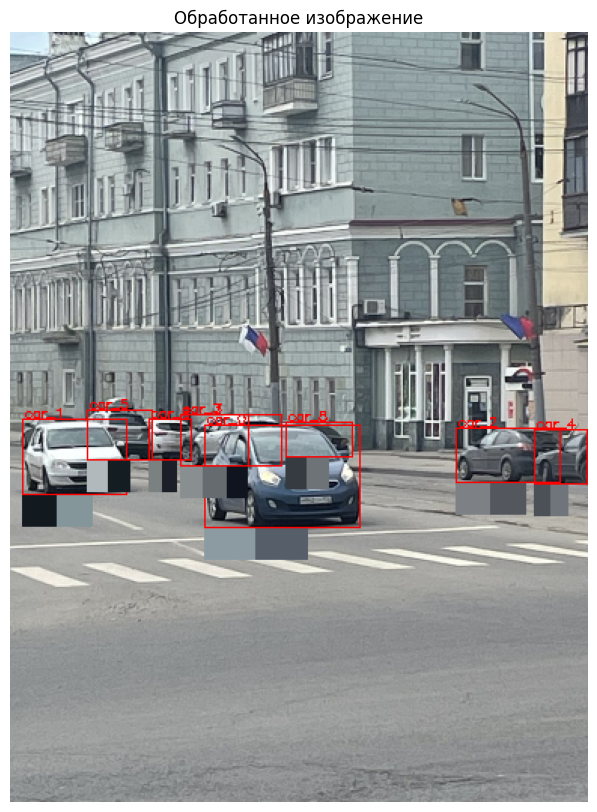

car_0 цвета:
Цвет: Серебристо-серо-голубоватый (RGB: [140 155 162])
Цвет: Серебристо-тёмно серый (RGB: [ 86  94 105])
car_1 цвета:
Цвет: Чёрный (RGB: [18 25 31])
Цвет: Серебристо-серо-голубоватый (RGB: [132 150 154])
car_2 цвета:
Цвет: Серый (RGB: [125 128 133])
Цвет: Серебристо-тёмно серый (RGB: [84 87 94])
car_3 цвета:
Цвет: Серый (RGB: [137 142 145])
Цвет: Чёрный (RGB: [16 20 31])
car_4 цвета:
Цвет: Серебристо-тёмно серый (RGB: [76 81 87])
Цвет: Серый (RGB: [112 117 123])
car_5 цвета:
Цвет: Светло-серый (RGB: [177 185 188])
Цвет: Чёрный (RGB: [20 29 34])
car_6 цвета:
Цвет: Серый (RGB: [123 129 129])
Цвет: Чёрный (RGB: [28 31 40])
car_7 цвета:
Цвет: Серый (RGB: [137 142 145])
Цвет: Серый (RGB: [102 107 111])
car_8 цвета:
Цвет: Серебристо-тёмно серый (RGB: [54 59 65])
Цвет: Серый (RGB: [110 115 119])


In [23]:
# Определение цветов и визуализация
for car_id, car_data in cars.items():
    if not car_data.get('colors_rgb', []).any():
        print(f"{car_id}: Нет цветов")
        continue
    
    colors_rgb = car_data['colors_rgb']
    bbox = car_data['bbox']
    
    # Получаем названия цветов
    color_names = [get_color_name(color) for color in colors_rgb]
    cars[car_id]['color_names'] = color_names
    
    # Визуализация: bbox с основным цветом + полоски
    output_image = image
    # Рисуем bbox
    cv2.rectangle(output_image, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (0, 0, 255), 1)
    
    # # Текст основного цвета в bbox
    # main_color = color_names[0]
    # cv2.putText(output_image, main_color, text_pos, cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 4)
    # cv2.putText(output_image, main_color, text_pos, cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
    
    # Полоски цветов под bbox
    patch_height = 20
    patch_width = (bbox[2] - bbox[0]) // 3

    for i, color in enumerate(colors_rgb):
        
        x_start = bbox[0] + i * patch_width
        x_end = x_start + patch_width
        y_start = bbox[3] + 1
        y_end = y_start + patch_height
        text_pos = (bbox[0] + 1, bbox[1] - 1)
        cv2.putText(output_image, f'{car_id}', text_pos, cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0, 0, 255), 1)
        cv2.rectangle(output_image, (x_start, y_start), (x_end, y_end), tuple(color[invert_mask].tolist()), -1)
    
# Вывод
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
plt.title(f"Обработанное изображение")
plt.axis('off')
plt.show()

for car_id in cars.keys():
    print(f"{car_id} цвета:")
    #print(cars[car_id]['color_names'])
    #print(cars[car_id]['color_names'], cars[car_id]['colors_rgb'])
    for name, rgb in zip(cars[car_id]['color_names'], cars[car_id]['colors_rgb']):
        print(f"Цвет: {name} (RGB: {rgb})")

# Функции для обработки изображения

In [24]:
def find_cars(image, model):
    
    model = YOLO(model)
    result = model(image)[0]
    cars = {} #определяем словарь, в дальнейшем в него будем добавлять всю важную информацию
    i = 0

    for box in result.boxes:

        if model.names[int(box.cls)] == 'car':
            bbox = box.xyxy[0].cpu().numpy().astype(int)  # --> [x_min, y_min, x_max, y_max]

            cars[f'car_{i}'] = {'bbox': None}
            cars[f'car_{i}']['bbox'] = bbox

    return image, cars

In [25]:
def segment_cars(image, cars, sam_checkpoint, model_type, device):

    try:
        sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
        sam.to(device)
    except FileNotFoundError:
        raise FileNotFoundError("Чекпоинт SAM не найден")

    predictor = SamPredictor(sam)

    # Сегментация для каждого автомобиля
    for car_id, car_data in cars.items():
        bbox = car_data['bbox']
        
        # Расширяем bbox на 10%
        margin = 0.1
        x_min, y_min, x_max, y_max = bbox
        w, h = x_max - x_min, y_max - y_min
        x_min = max(0, x_min - int(w * margin))
        y_min = max(0, y_min - int(h * margin))
        x_max = min(image.shape[1], x_max + int(w * margin))
        y_max = min(image.shape[0], y_max + int(h * margin))
        bbox_expanded = np.array([x_min, y_min, x_max, y_max])
        
        # Сегментация
        predictor.set_image(image)
        masks, scores, _ = predictor.predict(
            box=bbox_expanded,
            multimask_output=False
        )
        
        # Проверка маски
        if len(masks) == 0 or np.max(scores) < 0.5:
            #print(f"{car_id}: Маска не найдена, использую bbox")
            mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
            mask[bbox[1]:bbox[3], bbox[0]:bbox[2]] = 1
        else:
            mask = masks[np.argmax(scores)]
        
        # Сохраняем маску
        cars[car_id]['mask'] = mask

    # Освобождаем память
    del predictor
    del sam
    torch.cuda.empty_cache() if torch.cuda.is_available() else None
    
    return image, cars

In [26]:
def detect_color(image, cars):

    # Кластеризация для каждого автомобиля
    for car_id, car_data in cars.items():
        mask = car_data['mask']
        bbox = car_data['bbox']
    
        # Извлечение пикселей
        pixels = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)[mask > 0].reshape(-1, 3)
        if len(pixels) == 0:
            print(f"{car_id}: Пиксели не найдены, использую bbox")
            pixels = image[bbox[1]:bbox[3], bbox[0]:bbox[2]].reshape(-1, 3)
        
        # Фильтрация в HSV
        hsv_pixels = rgb_to_hsv(pixels/ 255.0)
        mask_valid = (hsv_pixels[:, 2] > 0.1) & (hsv_pixels[:, 2] < 0.95)
        filtered_pixels = pixels[mask_valid]
        
        if len(filtered_pixels) < 10:
            print(f"{car_id}: Недостаточно валидных пикселей")
            cars[car_id]['colors_rgb'] = []
            continue
        
        # Кластеризация
        kmeans = KMeans(n_clusters=2, random_state=42)
        kmeans.fit(filtered_pixels)
        labels = kmeans.labels_  # метка кластера для каждого объекта
        # Считаем количество объектов в каждом кластере
        unique_labels, counts = np.unique(labels, return_counts=True)
        # сохраняем в порядке убывания количества пикселей, принадлежащих к этому кластеру
        cars[car_id]['colors_rgb'] = kmeans.cluster_centers_.astype(int)[np.argsort(counts)[::-1]]
        
    return cars, image

In [27]:
def hex_to_rgb(hex_color):
    hex_color = hex_color.lstrip('#')
    return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))

In [28]:
def get_color_name(rgb):
    rgb = np.array(rgb) / 255.0
    hsv = rgb_to_hsv(rgb.reshape(1, 1, 3)).reshape(3)
    hue, saturation, value = hsv

    if saturation < 0.1:
        if value > 0.9: return "Белый"
        if value < 0.2: return "Черный"
        if value > 0.7: return "Светло-серый"
        if value > 0.4: return "Серый"
        return "Темно-серый"

    min_dist = float('inf')
    closest_color = None
    for colorname, name, hex_color in COLOR_DATABASE:
        ref_rgb = np.array(hex_to_rgb(hex_color)) / 255.0
        ref_hsv = rgb_to_hsv(ref_rgb.reshape(1, 1, 3)).reshape(3)
        hue_dist = min(abs(hue - ref_hsv[0]), 1 - abs(hue - ref_hsv[0]))
        dist = hue_dist * 0.7 + abs(saturation - ref_hsv[1]) * 0.2 + abs(value - ref_hsv[2]) * 0.1
        if dist < min_dist:
            min_dist = dist
            closest_color = name
            
    return closest_color

In [29]:
def find_color_names(cars, image):
    
    invert_mask = [2, 1, 0]
    
    for car_id, car_data in cars.items():
        if not car_data.get('colors_rgb', []).any():
            print(f"{car_id}: Нет цветов")
            continue
        
        colors_rgb = car_data['colors_rgb']
        bbox = car_data['bbox']
        
        # Получаем названия цветов
        color_names = [get_color_name(color) for color in colors_rgb]
        cars[car_id]['color_names'] = color_names
        
        # Визуализация: bbox с основным цветом + полоски
        output_image = image
        # Рисуем bbox
        cv2.rectangle(output_image, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (0, 0, 255), 1)
        
        # Полоски цветов под bbox
        patch_height = 20
        patch_width = (bbox[2] - bbox[0]) // 3

        for i, color in enumerate(colors_rgb):
            
            x_start = bbox[0] + i * patch_width
            x_end = x_start + patch_width
            y_start = bbox[3] + 1
            y_end = y_start + patch_height
            text_pos = (bbox[0] + 1, bbox[1] - 1)
            cv2.putText(output_image, f'{car_id}', text_pos, cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0, 0, 255), 1)
            cv2.rectangle(output_image, (x_start, y_start), (x_end, y_end), tuple(color[invert_mask].tolist()), -1)

        description = []

        for car_id in cars.keys():

            description.append(f"{car_id} цвета:")
            
            for name, rgb in zip(cars[car_id]['color_names'], cars[car_id]['colors_rgb']):
                description.append(f"Цвет: {name} (RGB: {rgb})")

    return output_image, description

In [30]:
def process_image(image, model, sam_checkpoint, model_type, device, max_size=512):
    
    #загружаем изображение
    image = cv2.imread(image)
    
    if image is None:
        raise ValueError('Нет изображения')
    
    #ресайзим до max_size, если требуется
    h, w = image.shape[:2]
    scale = max_size / max(h, w)
    if scale < 1:
        image = cv2.resize(image, (int(w * scale), int(h * scale)))

    #нормализуем
    image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)

    cars, image = detect_color(*segment_cars(*find_cars(image, model), sam_checkpoint, model_type, device))

    return find_color_names(cars, image)

In [31]:
output_image, description = process_image('data/photos/istockphoto-494522913-612x612.jpg', 'models/yolov8n.pt', 'models/sam_vit_b_01ec64.pth', 'vit_b', 'cpu', max_size=512)


0: 448x640 1 car, 46.4ms
Speed: 1.8ms preprocess, 46.4ms inference, 4.1ms postprocess per image at shape (1, 3, 448, 640)


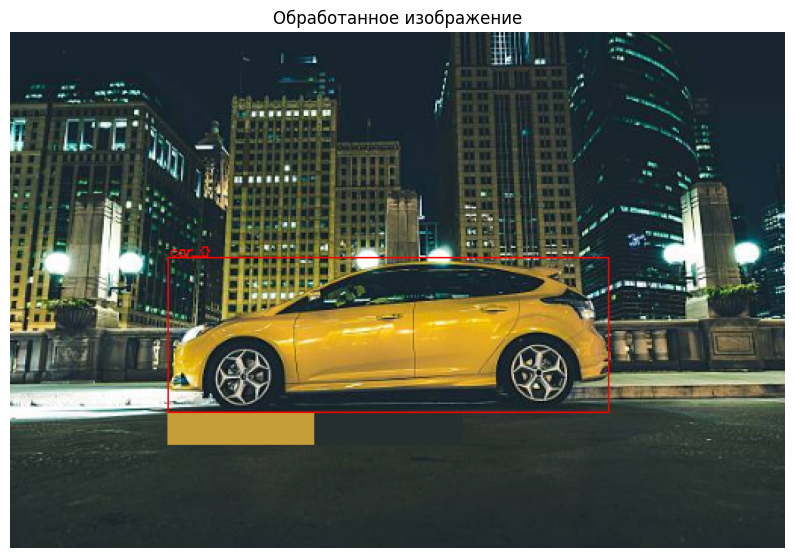

In [32]:
# Вывод
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
plt.title(f"Обработанное изображение")
plt.axis('off')
plt.show()

In [33]:
description

['car_0 цвета:',
 'Цвет: Светло-жёлтый (RGB: [197 157  57])',
 'Цвет: Серебристо-голубоватый (RGB: [37 47 45])']

# Тестирование модуля

In [34]:
from CarColorProcessor import CarColorProcessor

In [35]:
CarsProc = CarColorProcessor('models/yolov8n.pt', 'models/sam_vit_b_01ec64.pth', 'vit_b', 'data/colors.csv')

In [36]:
image = cv2.imread('data/photos/images.jpeg')

In [37]:
output = CarsProc.process(image)


0: 352x640 1 car, 39.3ms
Speed: 1.5ms preprocess, 39.3ms inference, 1.6ms postprocess per image at shape (1, 3, 352, 640)


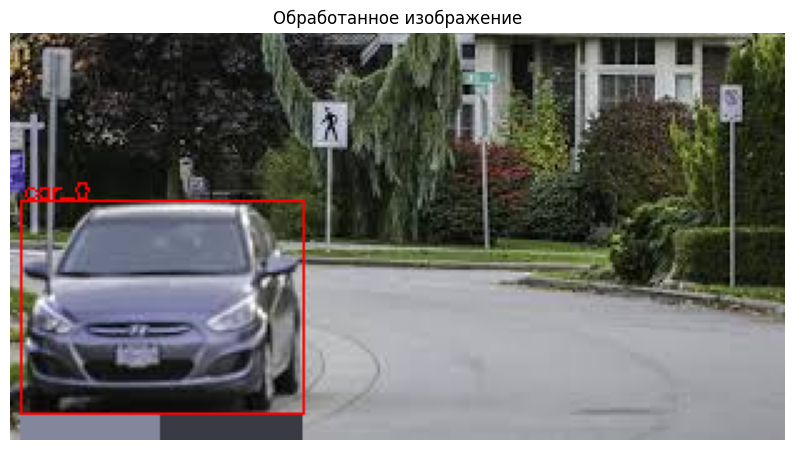

car_0 цвета:
Цвет: Серо-синий (RGB: (132, 135, 156))
Цвет: Серебристо-тёмно серый (RGB: (57, 58, 67))


In [38]:
# Вывод
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(output['image'], cv2.COLOR_BGR2RGB))
plt.title(f"Обработанное изображение")
plt.axis('off')
plt.show()

for s in output['description']: print(s)

# Тестируем API

In [39]:
import requests

url = "http://localhost:8000/predict"

with open("data/photos/images4.jpeg", "rb") as f:
    files = {"file": ("car.jpg", f, "image/jpeg")}
    headers = {"accept": "application/json"}
    response = requests.post(url, files=files, headers=headers)


output = response.json()

In [40]:
import base64
import numpy as np
import matplotlib.pyplot as plt
from io import BytesIO
import cv2

def base64_to_image(base64_string: str) -> np.ndarray:
    """
    Конвертирует строку base64 в изображение (numpy array)
    
    Args:
        base64_string: Строка base64 (может быть с префиксом 'data:image...')
        
    Returns:
        Изображение в формате numpy array (RGB)
    """
    # Удаляем префикс если он есть (например "data:image/jpeg;base64,")
    if ',' in base64_string:
        base64_string = base64_string.split(',')[1]
    
    # Декодируем base64 в бинарные данные
    image_bytes = base64.b64decode(base64_string)
    
    # Преобразуем в numpy array через BytesIO
    image_array = np.frombuffer(image_bytes, dtype=np.uint8)
    
    # Декодируем изображение с помощью OpenCV
    image = cv2.imdecode(image_array, cv2.IMREAD_COLOR)
    
    # Конвертируем BGR (OpenCV) в RGB (matplotlib)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    return image_rgb

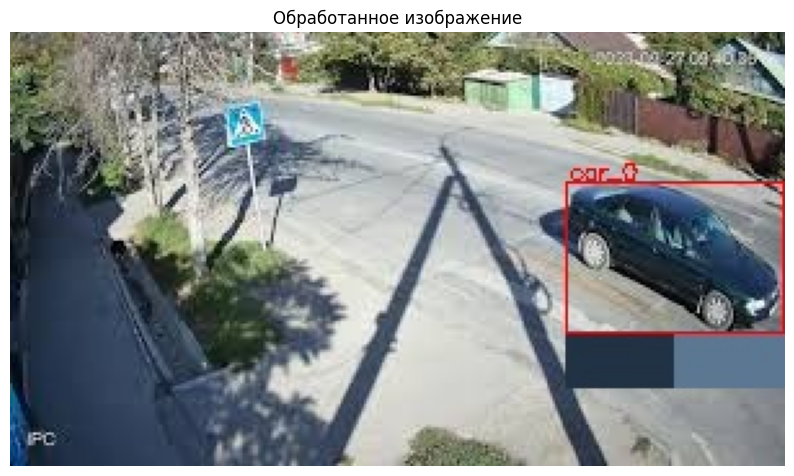

car_0 цвета:
Цвет: Светло-синий (RGB: (32, 50, 68))
Цвет: Серебристо-серо-синий (RGB: (92, 119, 145))


In [41]:
# Вывод
plt.figure(figsize=(10, 10))
plt.imshow(base64_to_image(output['image']))
plt.title(f"Обработанное изображение")
plt.axis('off')
plt.show()

for s in output['description']: print(s)